# Face Recognition (FR) - Faces Distance Analysis

This report show the analysis of the distances between images using differents approachs. The goal is to evaluate the relationship between different techniques.

In [1]:
import pandas as pd
import json
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np
from PIL import Image
from math import inf

from dataset import get_file_path, DATASET_KIND_ALIGNED, DATASET_KIND_SEG_IMG
import fr.face_decomposition as fd

### Prepare data and generate extra information

In [2]:
# Load distances from raw file
distances_dlib = json.load(open("fr\\distances_dlib.json", "r"))
distances_hog = json.load(open("fr\\distances_hog.json", "r"))
dlib_distances_lst = []
hog_distances_lst = []

for pair, tmp_distances in distances_dlib.items():
    if 'n' in pair: # TODO - Considering only imagens from VGGFACE2 (Starting with n*)
        tmp_distances['pair'] = pair
        dlib_distances_lst.append(tmp_distances)

for pair, tmp_distances in distances_hog.items():
    if 'n' in pair: # TODO - Considering only imagens from VGGFACE2 (Starting with n*)
        tmp_distances['pair'] = pair
        hog_distances_lst.append(tmp_distances)

# Transform into a dataframe and generate extra columns
df = pd.DataFrame(dlib_distances_lst)
hog_df = pd.DataFrame(hog_distances_lst)

# Combine dlib and hog distances
df = df.merge(right=hog_df, on='pair', how='left')

# Generate extra columns
df.loc[:, "img1"] = df.loc[:, 'pair'].apply(lambda x: x.split(' x ')[0])
df.loc[:, "img2"] = df.loc[:, 'pair'].apply(lambda x: x.split(' x ')[1])
df.loc[:, "person1"] = df.loc[:, 'img1'].apply(lambda x: x.split('_')[0])
df.loc[:, "person2"] = df.loc[:, 'img2'].apply(lambda x: x.split('_')[0])

# Delete unnecessary columns
df.drop(columns='pair', inplace=True)

## Distances data overview

Each row represents the distance between two images based on a approach. The data have the following columns:

1. img1: The name of the first image.
2. img2: The name of the second image.
3. person1: The id of the first person from the pair.
4. person2: The id of the second person from the pair.
5. dlib: The distance between the two images using the DLIB library (<http://dlib.net/>)
6. hog_all: The distance of the HOG descriptor applied to all face elements.
7. hog_face: The distance of the HOG descriptor applied to the face without elements (eyes, nose, mouth, etc)
8. hog_left_eye: The distance of the HOG descriptor applied to left eye.
9. hog_right_eye: The distance of the HOG descriptor applied to right eye.
10. hog_eyes: The distance of the HOG descriptor applied to both eyes.
11. hog_left_eyebrow: The distance of the HOG descriptor applied to left eyebrow.
12. hog_right_eyebrow: The distance of the HOG descriptor applied to right eyebrow.
13. hog_eyebrows: The distance of the HOG descriptor applied to both eyebrows.
14. hog_left_ear: The distance of the HOG descriptor applied to left ear.
15. hog_right_ear: The distance of the HOG descriptor applied to right ear.
16. hog_ears: The distance of the HOG descriptor applied to both ears.
17. hog_nose: The distance of the HOG descriptor applied to nose.
18. hog_lower_lip: The distance of the HOG descriptor applied to lower lip.
19. hog_upper_lip: The distance of the HOG descriptor applied to upper lip.
20. hog_mouth: The distance of the HOG descriptor applied to whole mouth.
21. hog_mouth_and_nose: The distance of the HOG descriptor applied to mouth and nose.
22. hog_eyes_and_eyebrows: The distance of the HOG descriptor applied to eyes and eyebrows.
23. hog_eyes_and_nose: The distance of the HOG descriptor applied to eye and nose.
24. hog_full_face: The distance of the HOG descriptor applied to all face elements but ears and mouth.

### Face elements segmentation examples

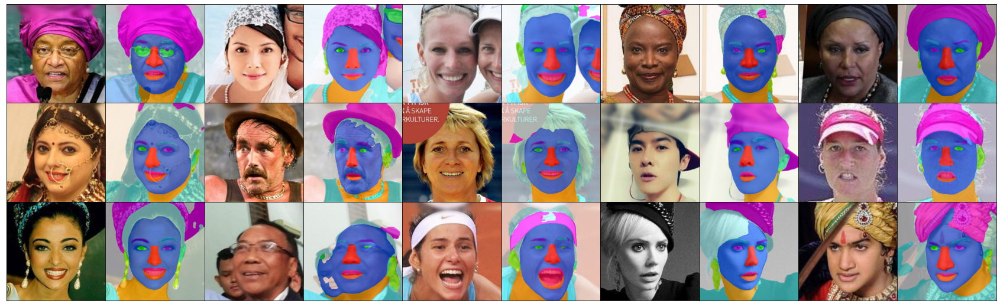

In [3]:
ROWS = 3
HEIGHT = 256
WIDTH = 256

imgs = []
persons = list(df.person1.unique())[:15]
for person in persons:
    tmp_original = get_file_path(df[df['person1'] == person].iloc[0]['img1'], dataset_kind=DATASET_KIND_ALIGNED)
    tmp_segmentation = get_file_path(df[df['person1'] == person].iloc[0]['img2'], dataset_kind=DATASET_KIND_SEG_IMG)

    imgs += [
                Image.open(tmp_original).resize((WIDTH, HEIGHT)),
                Image.open(tmp_segmentation).resize((WIDTH, HEIGHT)),
    ]

fig = plt.figure(figsize=(30., 15.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(ROWS, int(len(imgs)/ROWS)),
                 axes_pad=0,  # pad between axes in inch.
                 share_all=True,
                 )

grid[0].get_yaxis().set_ticks([])
grid[0].get_xaxis().set_ticks([])

for ax, im in zip(grid, imgs):
    ax.imshow(im)

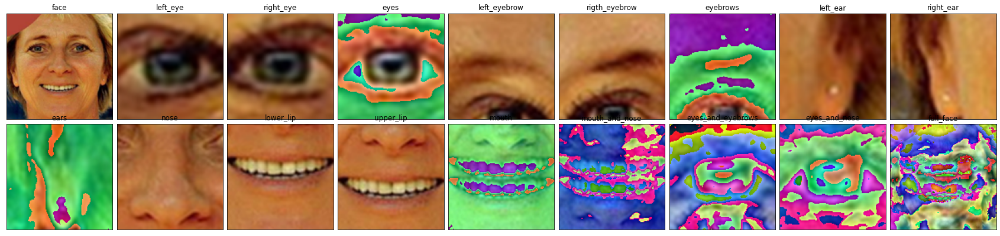

In [21]:
ROWS = 2
HEIGHT = 128
WIDTH = 128

persons = list(df.person1.unique())[:15]

face_parts = fd.decompose_face_no_blank(df[df['person1'] == persons[7]].iloc[0]['img1'])
face = Image.fromarray(fd.get_face(face_parts, no_blank=True))
left_eye = Image.fromarray(fd.get_left_eye(face_parts, no_blank=True))
right_eye = Image.fromarray(fd.get_right_eye(face_parts, no_blank=True))
eyes = Image.fromarray(fd.get_eyes(face_parts, no_blank=True))
left_eyebrow = Image.fromarray(fd.get_left_eyebrow(face_parts, no_blank=True))
rigth_eyebrow = Image.fromarray(fd.get_rigth_eyebrow(face_parts, no_blank=True))
eyebrows = Image.fromarray(fd.get_eyebrows(face_parts, no_blank=True))
left_ear = Image.fromarray(fd.get_left_ear(face_parts, no_blank=True))
right_ear = Image.fromarray(fd.get_right_ear(face_parts, no_blank=True))
ears = Image.fromarray(fd.get_ears(face_parts, no_blank=True))
nose = Image.fromarray(fd.get_nose(face_parts, no_blank=True))
lower_lip = Image.fromarray(fd.get_lower_lip(face_parts, no_blank=True))
upper_lip = Image.fromarray(fd.get_upper_lip(face_parts, no_blank=True))
mouth = Image.fromarray(fd.get_mouth(face_parts, no_blank=True))
mouth_and_nose = Image.fromarray(fd.get_mouth_and_nose(face_parts, no_blank=True))
eyes_and_eyebrows = Image.fromarray(fd.get_eyes_and_eyebrows(face_parts, no_blank=True))
eyes_and_nose = Image.fromarray(fd.get_eyes_and_nose(face_parts, no_blank=True))
full_face = Image.fromarray(fd.get_full_face(face_parts, no_blank=True))

imgs = [
            ("face", face.resize((WIDTH, HEIGHT))),
            ("left_eye", left_eye.resize((WIDTH, HEIGHT))),
            ("right_eye", right_eye.resize((WIDTH, HEIGHT))),
            ("eyes", eyes.resize((WIDTH, HEIGHT))),
            ("left_eyebrow", left_eyebrow.resize((WIDTH, HEIGHT))),
            ("rigth_eyebrow", rigth_eyebrow.resize((WIDTH, HEIGHT))),
            ("eyebrows", eyebrows.resize((WIDTH, HEIGHT))),
            ("left_ear", left_ear.resize((WIDTH, HEIGHT))),
            ("right_ear", right_ear.resize((WIDTH, HEIGHT))),
            ("ears", ears.resize((WIDTH, HEIGHT))),
            ("nose", nose.resize((WIDTH, HEIGHT))),
            ("lower_lip", lower_lip.resize((WIDTH, HEIGHT))),
            ("upper_lip", upper_lip.resize((WIDTH, HEIGHT))),
            ("mouth", mouth.resize((WIDTH, HEIGHT))),
            ("mouth_and_nose", mouth_and_nose.resize((WIDTH, HEIGHT))),
            ("eyes_and_eyebrows", eyes_and_eyebrows.resize((WIDTH, HEIGHT))),
            ("eyes_and_nose", eyes_and_nose.resize((WIDTH, HEIGHT))),
            ("full_face", full_face.resize((WIDTH, HEIGHT)))
]

fig = plt.figure(figsize=(30., 15.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(ROWS, int(len(imgs)/ROWS)),
                 axes_pad=.1,  # pad between axes in inch.
                 share_all=True,
                 )

grid[0].get_yaxis().set_ticks([])
grid[0].get_xaxis().set_ticks([])

for ax, im in zip(grid, imgs):
    ax.imshow(im[1])
    ax.set_title(im[0])

## Person correlation for all x all

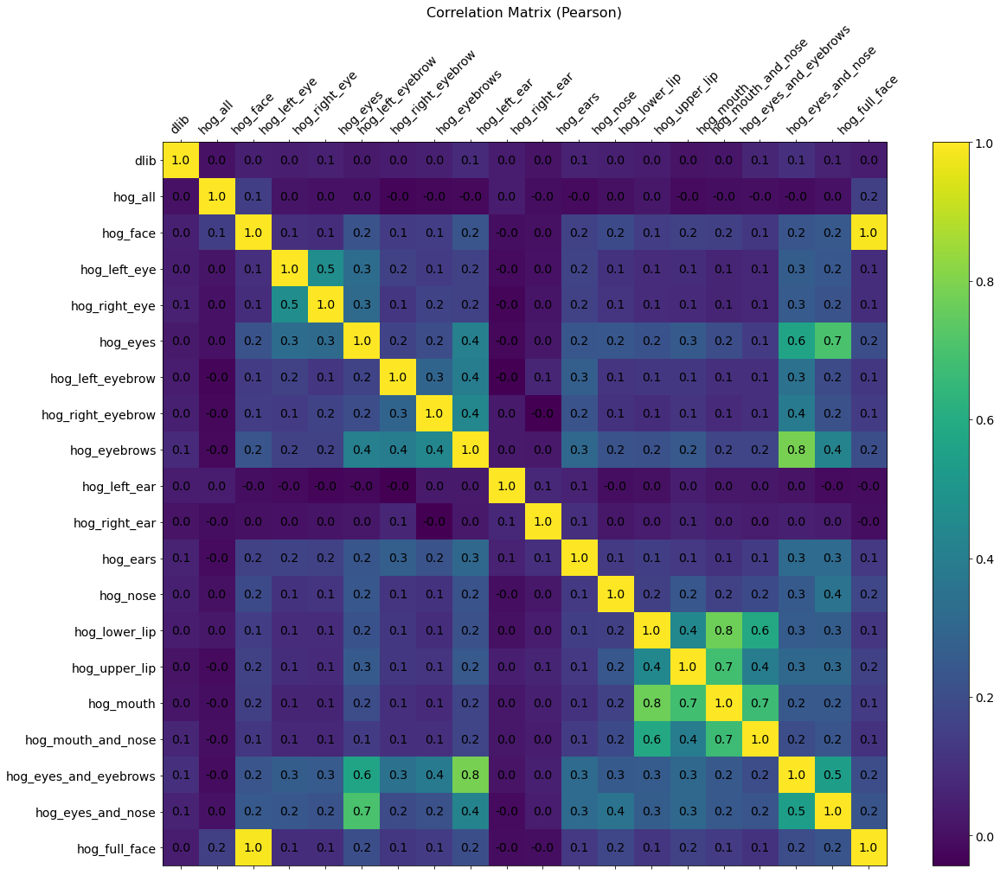

In [5]:
f = plt.figure(figsize=(19, 15))
corr = df.corr()
plt.matshow(corr, fignum=f.number)
plt.xticks(range(df.select_dtypes(['number']).shape[1]), df.select_dtypes(['number']).columns, fontsize=14, rotation=45)
plt.yticks(range(df.select_dtypes(['number']).shape[1]), df.select_dtypes(['number']).columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix (Pearson)', fontsize=16)

for (i, j), z in np.ndenumerate(corr):
    plt.text(j, i, '{:0.1f}'.format(z), ha='center', va='center', size=14)

### The person correlation between the distances from images shows the following insights:

- No other comparison presents correlation with dlib distances;
- There are relevant correlation (> 0.5) between the HOG descriptors for imagens with intercting face elements. Ex: Image 1 have eyes and image 2 have eyes and nose.
- A weak correlation (0.3) exists between the HOG descriptors for ears and eyes, eyebrows.
- Medium correlation (0.5 and 0.4) exists between the HOG descriptors for mirrored pieces of the face (left and roght eyes, upper and lower lip, etc). This could represent a kind of symmetry between the face elements.
- **Strong correlation (1.0) between face (without eyes, eyebrows, nose and mouth) and full face (with all face elements). This could represent that the face shape is more relevant for evaluate similarity than the isolated elements. But also can show that the descriptor is considering the "black" empty spaces having morphological information.**

## DLIB Distances vs HOG Distances

### DLIB comparison for all pairs (same persons comparisons in Blue)

In [6]:
# Utilitaty funcion
def next_axis(rows, cols):
    i = 0
    j = 0
    while True:
        yield (i, j)
        j += 1
        if j == cols:
            j = 0
            i += 1
        
        if i > rows:
            break

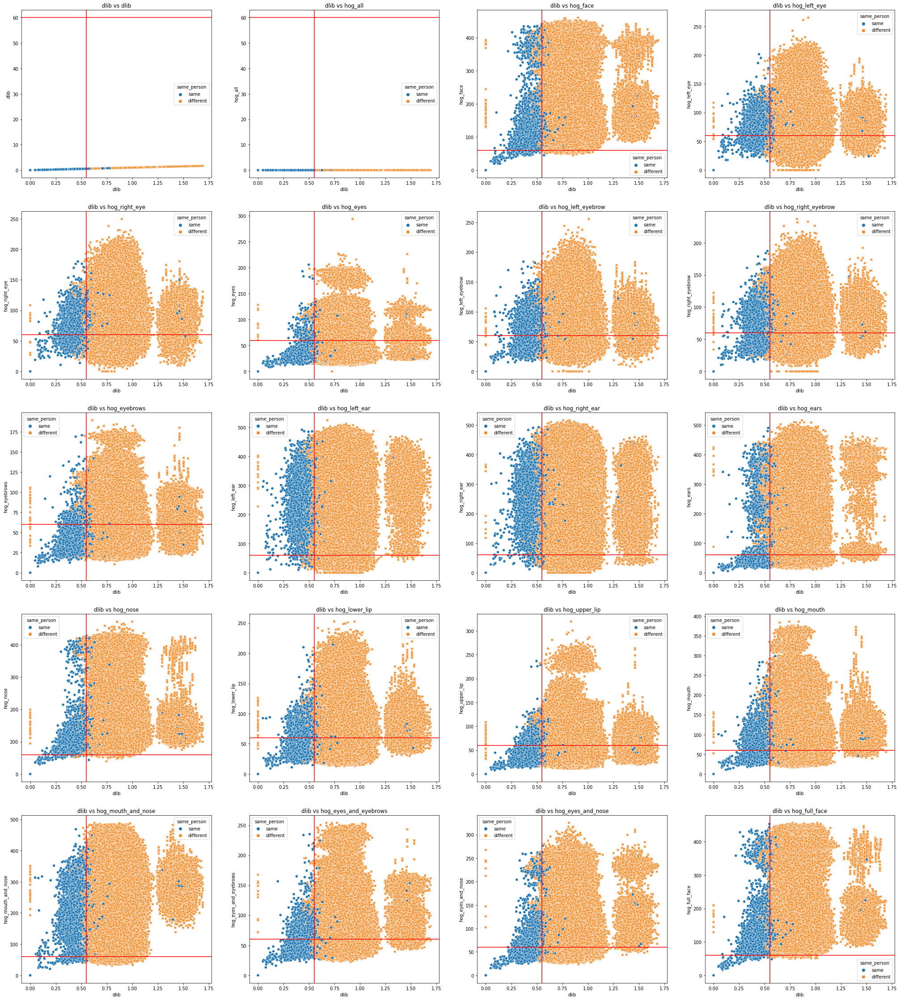

In [7]:
ROWS = 5
COLS = 4
fig, axes = plt.subplots(nrows=ROWS, ncols=COLS, figsize=(35,40))

tmp_df = df.copy()
tmp_df['same_person'] = tmp_df.person1 == tmp_df.person2
tmp_df.same_person = tmp_df.same_person.apply(lambda x: 'same' if x else 'different')
tmp_df = tmp_df.drop(columns=['person1', 'person2', 'img1', 'img2'])
make_idx_generator = next_axis(rows=ROWS, cols=COLS)
columns = list(tmp_df.columns)
for distance_col in columns:
    if distance_col == 'same_person':
        continue
    row_idx, col_idx = make_idx_generator.__next__()
    axes[row_idx, col_idx].set_title(f'{columns[0]} vs {distance_col}')
    g = sns.scatterplot(ax=axes[row_idx, col_idx], x=columns[0], y=distance_col, data=tmp_df, hue='same_person', style='same_person')
    g.axhline(60, color='r')
    g.axvline(0.55, color='r')

Loking to the X axis (DLIB distance), we can observe that a good separation between images from same persons (blue) and different persons (orange) is present at < ~0.55. Using the Y axis (HOG descriptors distance) there is no separation between images from same persons and different persons, in some combinations of HOG descriptors there is a small separation for a group of images (< ~60). Ex: "HOG Face", "Mouth and Nose", "HOG Eyes and Nose" and "HOG Full Face".

### DLIB comparison considering only same persons

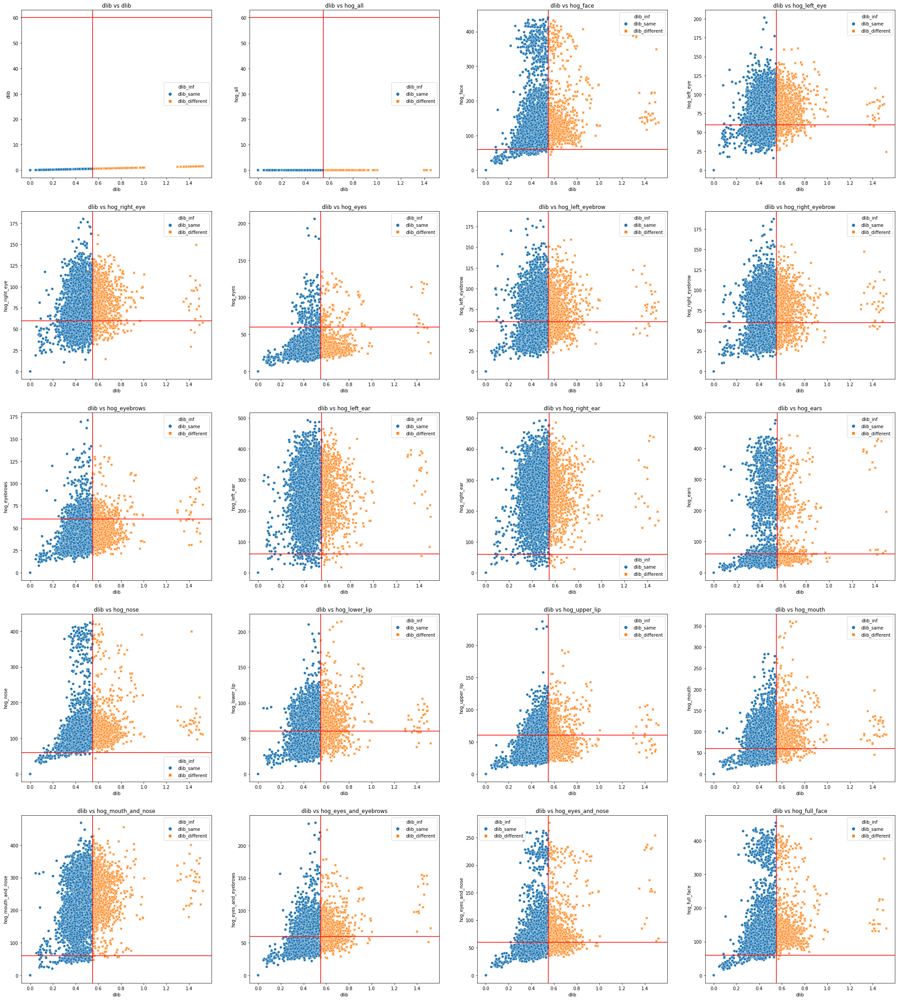

In [8]:
ROWS = 5
COLS = 4
fig, axes = plt.subplots(nrows=ROWS, ncols=COLS, figsize=(35,40))

tmp_df = df[df['person1'] == df['person2']].copy().drop(columns=['person1', 'person2', 'img1', 'img2'])
tmp_df['dlib_inf'] = tmp_df.dlib < 0.55
tmp_df.dlib_inf = tmp_df.dlib_inf.apply(lambda x: 'dlib_same' if x else 'dlib_different')
make_idx_generator = next_axis(rows=ROWS, cols=COLS)
columns = list(tmp_df.columns)
for distance_col in columns:
    if distance_col == 'dlib_inf':
        continue
    row_idx, col_idx = make_idx_generator.__next__()
    axes[row_idx, col_idx].set_title(f'{columns[0]} vs {distance_col}')
    g = sns.scatterplot(ax=axes[row_idx, col_idx], x=columns[0], y=distance_col, data=tmp_df, hue='dlib_inf', style='dlib_inf')
    g.axhline(60, color='r')
    g.axvline(0.55, color='r')

## Analysing distances distribution for only one person

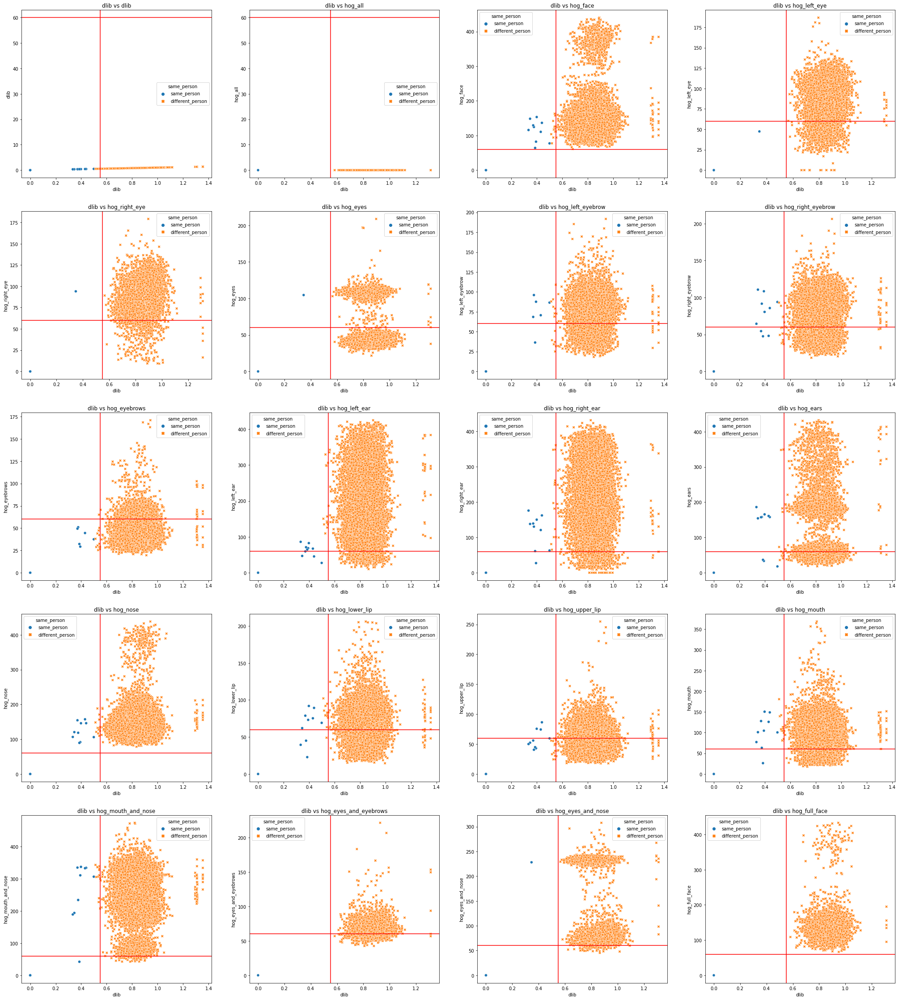

In [9]:
ROWS = 5
COLS = 4
PERSON_REF = df.iloc[0]['person1']

fig, axes = plt.subplots(nrows=ROWS, ncols=COLS, figsize=(35,40))

tmp_df = df[df['person1'] == PERSON_REF].copy()
# tmp_df['dlib_inf'] = tmp_df.dlib < 0.55
tmp_df['same_person'] = tmp_df['person2'] == PERSON_REF
# tmp_df.dlib_inf = tmp_df.dlib_inf.apply(lambda x: 'dlib_same' if x else 'dlib_different')
tmp_df.same_person = tmp_df.same_person.apply(lambda x: 'same_person' if x else 'different_person')
make_idx_generator = next_axis(rows=ROWS, cols=COLS)
tmp_df.drop(columns=['person1', 'person2', 'img1', 'img2'], inplace=True)
columns = list(tmp_df.columns)
for distance_col in columns:
    if distance_col == 'dlib_inf' or distance_col == 'same_person':
        continue
    row_idx, col_idx = make_idx_generator.__next__()
    axes[row_idx, col_idx].set_title(f'{columns[0]} vs {distance_col}')
    # g = sns.scatterplot(ax=axes[row_idx, col_idx], x=columns[0], y=distance_col, data=tmp_df, hue='dlib_inf', style='dlib_inf')
    g = sns.scatterplot(ax=axes[row_idx, col_idx], x=columns[0], y=distance_col, data=tmp_df, hue='same_person', style='same_person')
    g.axhline(60, color='r')
    g.axvline(0.55, color='r')

# Kendal Tau and Spearman Distances

In [10]:
# Find the top N matches for each strategy
grouped_by_imgs = df.groupby(by=['img1', 'img2']).sum()
closest = {}
N = 100

columns = list(grouped_by_imgs.columns)
for col in columns:
    tmp_sorted = grouped_by_imgs.sort_values(by=col, ascending=True, inplace=False)
    closest[col] = {}
    for img1, tmp_df in tmp_sorted.groupby(level=0):
        closest[col][img1] = tmp_df.loc[img1, :].reset_index().img2.head(N)

closest = pd.DataFrame(closest)

# Calculate the kendall for dlib vs all other strategies for every image
kendall_corr = []
spearman_corr = []
for img1, row in closest.iterrows():
    columns = row.index.to_list()
    dlib_col = columns[0]
    for tmp_col in columns[1:]:
        tmp_key = f'{dlib_col} x {tmp_col}'
        kendall_corr.append({
                                'img1': img1,
                                tmp_key: row.loc[dlib_col].corr(other=row.loc[tmp_col], method='kendall')
        })

        spearman_corr.append({
                                'img1': img1,
                                tmp_key: row.loc[dlib_col].corr(other=row.loc[tmp_col], method='spearman')
        })

kendall_corr = pd.DataFrame(kendall_corr).groupby(by='img1').max()
spearman_corr = pd.DataFrame(spearman_corr).groupby(by='img1').max()

In [41]:
kendall_corr

,dlib x hog_all,dlib x hog_face,dlib x hog_left_eye,dlib x hog_right_eye,dlib x hog_eyes,dlib x hog_left_eyebrow,dlib x hog_right_eyebrow,dlib x hog_eyebrows,dlib x hog_left_ear,dlib x hog_right_ear,dlib x hog_ears,dlib x hog_nose,dlib x hog_lower_lip,dlib x hog_upper_lip,dlib x hog_mouth,dlib x hog_mouth_and_nose,dlib x hog_eyes_and_eyebrows,dlib x hog_eyes_and_nose,dlib x hog_full_face
img1,,,,,,,,,,,,,,,,,,,
n000001_0319_01,0.046465,-0.005253,0.027879,-0.056162,-0.024242,0.104646,-0.074343,0.095354,0.103030,-0.034343,-0.121616,-0.004040,-0.033939,-0.049697,0.130909,-0.047677,0.016970,-0.002828,-0.137778
n000001_0379_01,0.016162,-0.057374,-0.046869,-0.024646,0.005253,-0.110707,-0.138990,0.053333,-0.004848,0.000404,-0.007677,0.002828,0.066667,0.025455,0.010505,0.018182,0.018990,-0.023838,-0.009293
n000001_0391_01,-0.040404,-0.082020,-0.031919,0.048485,0.072727,-0.044040,0.021818,-0.008081,-0.115556,0.008081,-0.030707,-0.000404,-0.008889,0.151111,0.158384,0.061010,-0.040404,0.019394,0.042020
n000001_0403_01,0.152727,-0.004444,0.068687,-0.069091,0.030303,-0.040000,0.013737,-0.084444,0.071515,-0.014545,0.094949,0.024646,0.078384,0.100202,-0.045657,0.018990,0.012525,-0.033535,0.081616
n000001_0425_01,0.044444,-0.017778,0.019394,-0.002828,0.087677,0.014141,-0.067475,0.025455,0.073939,0.051717,-0.025455,0.094141,-0.041616,0.085253,0.018182,-0.015354,-0.081212,0.034747,0.136566
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
n009286_0078_01,-0.164444,-0.088081,0.084848,-0.050101,0.014545,-0.012121,0.085657,0.009293,-0.000808,0.086869,-0.044444,0.052525,-0.037576,0.033939,0.035556,0.176162,0.036768,-0.091717,0.026263
n009286_0119_02,-0.102626,-0.056970,-0.008081,0.021414,-0.079596,-0.025859,0.071515,-0.040404,-0.035556,0.030707,-0.043232,0.085657,0.069495,-0.037980,-0.011717,0.028283,-0.026263,0.114343,-0.079192
n009286_0119_03,-0.092525,-0.010909,0.063838,0.128889,-0.010101,0.050909,-0.069899,0.114343,0.254545,0.097778,-0.071515,-0.012929,0.034747,0.026667,0.064242,0.045657,0.108283,0.036768,0.082020


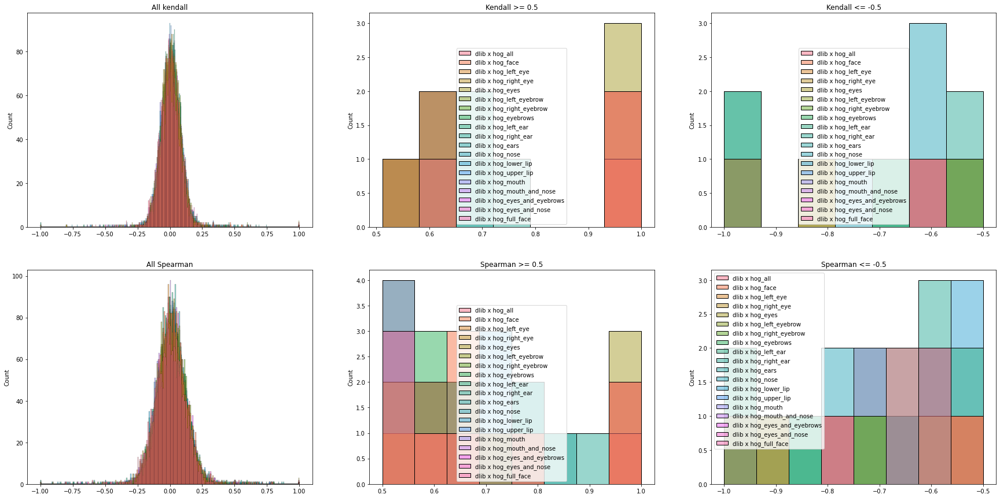

In [40]:
ROWS = 2
COLS = 3

fig, axes = plt.subplots(nrows=ROWS, ncols=COLS, figsize=(30,15))

# Kendal plots
axes[0, 0].set_title("All kendall")
g = sns.histplot(ax=axes[0, 0], data=kendall_corr, legend=False)

axes[0, 1].set_title("Kendall >= 0.5")
g = sns.histplot(ax=axes[0, 1], data=kendall_corr.mask(kendall_corr < 0.5))

axes[0, 2].set_title("Kendall <= -0.5")
g = sns.histplot(ax=axes[0, 2], data=kendall_corr.mask(kendall_corr > -0.5))

# Spearman plots
axes[1, 0].set_title("All Spearman")
g = sns.histplot(ax=axes[1, 0], data=spearman_corr, legend=False)

axes[1, 1].set_title("Spearman >= 0.5")
g = sns.histplot(ax=axes[1, 1], data=spearman_corr.mask(spearman_corr < 0.5))

axes[1, 2].set_title("Spearman <= -0.5")
g = sns.histplot(ax=axes[1, 2], data=spearman_corr.mask(spearman_corr > -0.5))